# Рынок заведений общественного питания Москвы

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.<br>

Для начала нам нужно подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.<br>

Нам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

## Загрузка данных

In [1]:
# Импорт всех необходимых библиотек
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import folium
from folium.plugins import MarkerCluster

# Подключение модуля для работы с JSON-форматом
import json

pd.set_option('display.float_format', '{:,.2f}'.format)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 500)

In [2]:
# Загрузка датасета и просмотр первых строк
file_path = 'moscow_places.csv'
data = pd.read_csv(file_path)
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,Средний счёт:1500–1600 ₽,"1,550.00",NaN,0,4.00
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.89,37.53,4.60,средние,Средний счёт:от 1000 ₽,"1,000.00",NaN,0,45.00
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,Цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,Средний счёт:400–600 ₽,500.00,NaN,1,148.00


In [3]:
# Изучение общей информации
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


В датасете представлено 8406 заведений общественного питания Москвы. В нем 14 столбцов с различной информацией о каждом заведении:
- `name` (название заведения) — строковые данные, нет пропусков;
- `category` (категория заведения) — строковые данные, нет пропусков;
- `address` (адрес заведения) — строковые данные, нет пропусков;
- `district` (административный район) — строковые данные, нет пропусков;
- `hours` (часы работы) — строковые данные, 7870 значений, есть пропуски;
- `lat` (широта) — числовые данные (float), нет пропусков;
- `lng` (долгота) — числовые данные (float), нет пропусков;
- `rating` (рейтинг заведения) — числовые данные (float), нет пропусков;
- `price` (категория цен) — строковые данные, 3315 значений, есть пропуски;
- `avg_bill` (средняя стоимость заказа) — строковые данные, 3816 значений, есть пропуски;
- `middle_avg_bill` (числовая оценка среднего чека) — числовые данные (float), 3149 значений, есть пропуски;
- `middle_coffee_cup` (числовая оценка стоимости чашки капучино) — числовые данные (float), 535 значений, есть пропуски;
- `chain` (является ли заведение сетевым) — числовые данные (int, 0 или 1), нет пропусков;
- `seats` (количество посадочных мест) — числовые данные (float), 4795 значений, есть пропуски.

## Предобработка данных

### Поиск дубликатов

In [4]:
# Поиск полных дублей
complete_duplicates = data[data.duplicated()]
complete_duplicates

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


Явных дублей не обнаружено. Теперь проверим неявные по столбцам `name` и `address`.

In [5]:
# Создание копии датасета
data_copy = data.copy()

# Приведение названий заведений и адресов к нижнему регистру
data_copy['name'] = data_copy['name'].str.lower()
data_copy['address'] = data_copy['address'].str.lower()

# Поиск дубликатов
duplicate_names = data_copy[data_copy.duplicated(subset=['name', 'address'], keep='first')]
duplicate_names

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
215,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.53,3.20,NaN,NaN,NaN,NaN,0,NaN
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.81,37.50,4.20,NaN,NaN,NaN,NaN,1,188.00
2420,раковарня клешни и хвосты,"бар,паб","москва, проспект мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.81,37.64,4.40,NaN,NaN,NaN,NaN,1,150.00
3109,хлеб да выпечка,кафе,"москва, ярцевская улица, 19",Западный административный округ,NaN,55.74,37.41,4.10,NaN,NaN,NaN,NaN,0,276.00


Обнаружилось 4 неявных дубля, которые мы можем удалить по индексам, чтобы не менять исходный датасет.

In [6]:
# Поиск индексов дубликатов
duplicate_indexes = duplicate_names.index.tolist()

# Удаление строк с дублирующими индексами из исходного датасета
data = data.drop(index=duplicate_indexes)
data.shape[0]

8402

Отлично, теперь мы избавились от всех дублей.

### Поиск пропусков

In [7]:
# Поиск пропусков
data.isnull().sum()

name                    0
category                0
address                 0
district                0
hours                 535
lat                     0
lng                     0
rating                  0
price                5087
avg_bill             4586
middle_avg_bill      5253
middle_coffee_cup    7867
chain                   0
seats                3610
dtype: int64

Пропуски встречаются в столбцах `hours`, `price`, `avg_bill`, `middle_avg_bill`, `middle_coffee_cup` и `seats`.

В данном проекте пропуски заполнять не нужно, так как это искажает данные. Оставим пропуски без изменений.

### Создание дополнительных столбцов

In [8]:
# Столбец с названиями улиц
data['street'] = data['address'].apply(lambda x: x.split(',')[1].strip() if ',' in x else x)

data[['address', 'street']].head()

,address,street
0,"Москва, улица Дыбенко, 7/1",улица Дыбенко
1,"Москва, улица Дыбенко, 36, корп. 1",улица Дыбенко
2,"Москва, Клязьминская улица, 15",Клязьминская улица
3,"Москва, улица Маршала Федоренко, 12",улица Маршала Федоренко
4,"Москва, Правобережная улица, 1Б",Правобережная улица


In [9]:
# Столбец с обозначением, что заведение работает ежедневно и круглосуточно (24/7)
data['is_24_7'] = data['hours'].apply(lambda x: pd.notnull(x) and ('круглосуточно' in x.lower() and 'ежедневно' in x.lower()))

data[['hours', 'is_24_7']].head()

,hours,is_24_7
0,"ежедневно, 10:00–22:00",False
1,"ежедневно, 10:00–22:00",False
2,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",False
3,"ежедневно, 09:00–22:00",False
4,"ежедневно, 10:00–22:00",False


Мы успешно добавили 2 столбца для дополнительного анализа.

Таким образом, мы выполнили предобработку данных:
- проверили и удалили дубликаты;
- нашли пропуски, но оставили как есть, чтобы не искажать данные;
- добавили дополнительные столбцы для дальнейшего анализа.

## Анализ данных

### Распределение заведений по категориям

In [10]:
# Подсчет количества заведений в каждой категории
category_counts = data['category'].value_counts().reset_index()
category_counts.columns = ['category', 'count']
category_counts

,category,count
0,кафе,2376
1,ресторан,2042
2,кофейня,1413
3,"бар,паб",764
4,пиццерия,633
5,быстрое питание,603
6,столовая,315
7,булочная,256


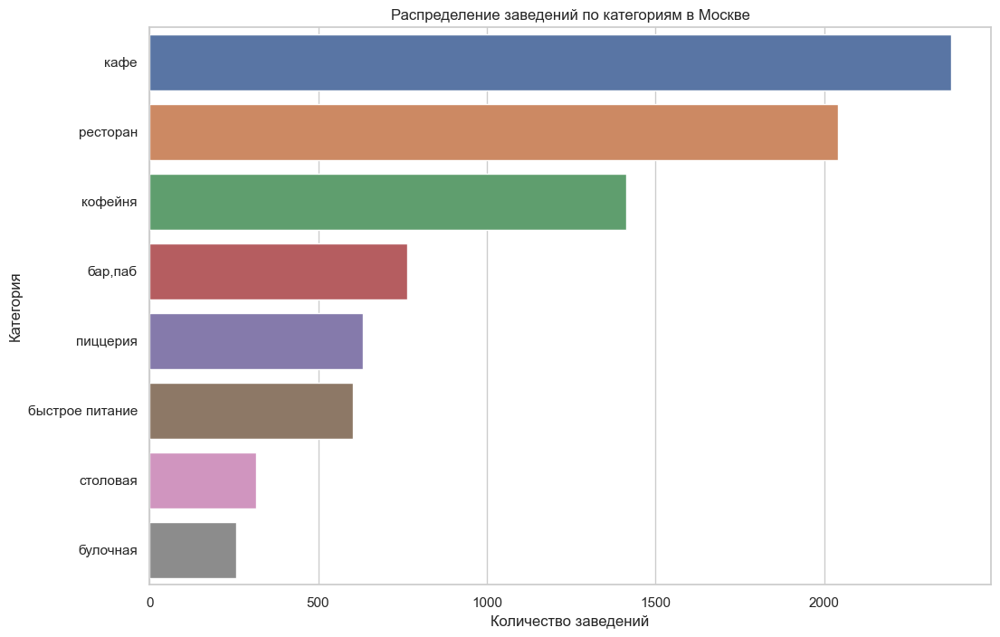

In [11]:
# Настройка стиля seaborn
sns.set(style="whitegrid")

# Построение графика
plt.figure(figsize=(12, 8))
sns.barplot(x='count', y='category', data=category_counts)
plt.title('Распределение заведений по категориям в Москве')
plt.xlabel('Количество заведений')
plt.ylabel('Категория')
plt.show()

Кафе являются самой популярной категорией заведений общественного питания в Москве, 2376 заведений, что может свидетельствовать о популярности неформальных мест для встреч и отдыха.<br>
Рестораны занимают второе место, 2042 заведения, что говорит о высоком спросе на более формальные заведения для еды.<br>
Кофейни также достаточно популярны, 1413 заведения, что может отражать тренд на рост потребления кофе и связанных с этим культурных аспектов.<br>
4-8 места занимают категории "бар,паб", "пиццерия", "быстрое питание", "столовая", "булочная".

### Количество посадочных мест в местах по категориям

In [12]:
# Анализ количества посадочных мест по категориям
seats_by_category = data.groupby('category')['seats'].describe().reset_index()
seats_by_category

,category,count,mean,std,min,25%,50%,75%,max
0,"бар,паб",467.00,124.48,145.16,0.00,48.00,82.00,148.50,"1,288.00"
1,булочная,148.00,89.39,97.69,0.00,25.00,50.00,120.00,625.00
2,быстрое питание,349.00,98.89,106.61,0.00,28.00,65.00,140.00,"1,040.00"
3,кафе,"1,217.00",97.37,117.92,0.00,35.00,60.00,120.00,"1,288.00"
4,кофейня,751.00,111.20,127.84,0.00,40.00,80.00,144.00,"1,288.00"
5,пиццерия,427.00,94.50,112.28,0.00,30.00,55.00,120.00,"1,288.00"
6,ресторан,"1,269.00",121.89,123.79,0.00,48.00,86.00,150.00,"1,288.00"
7,столовая,164.00,99.75,122.95,0.00,40.00,75.50,117.00,"1,200.00"


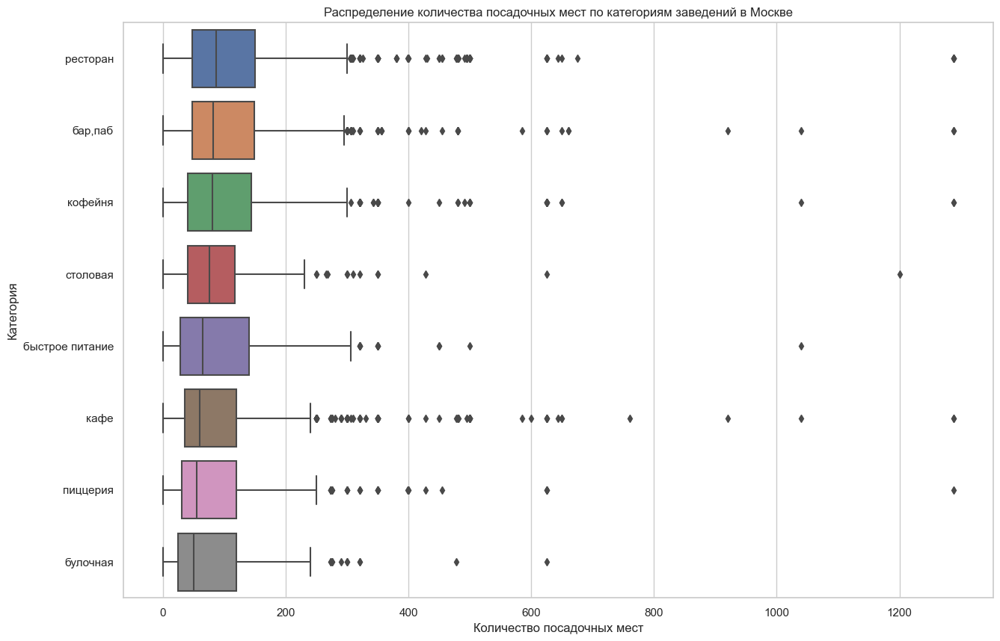

In [13]:
# Сортировка категорий по медиане количества посадочных мест
sorted_categories = seats_by_category.sort_values(by='50%', ascending=False)['category']

# Построение графика - boxplot с сортировкой по медиане
plt.figure(figsize=(15, 10))
sns.boxplot(x='seats', y='category', data=data, order=sorted_categories)
plt.title('Распределение количества посадочных мест по категориям заведений в Москве')
plt.xlabel('Количество посадочных мест')
plt.ylabel('Категория')
plt.show()

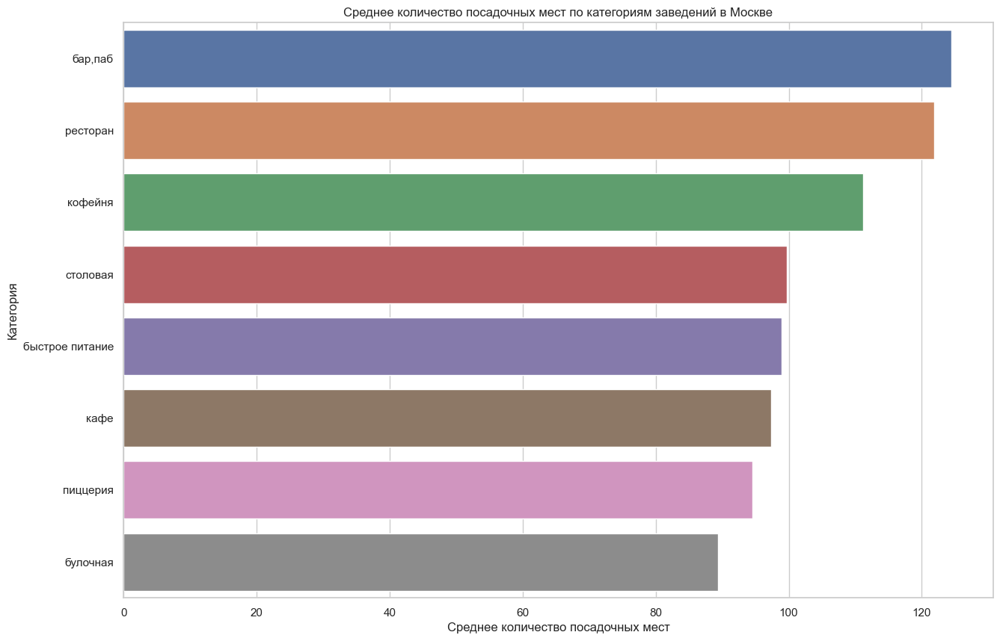

In [14]:
# Построение графика - barplot (среднее количество мест по категориям)
average_seats = data.groupby('category')['seats'].mean().reset_index()

# Сортировка данных по рейтингу от большего к меньшему
average_seats = average_seats.sort_values(by='seats', ascending=False)

plt.figure(figsize=(15, 10))
sns.barplot(x='seats', y='category', data=average_seats)
plt.title('Среднее количество посадочных мест по категориям заведений в Москве')
plt.xlabel('Среднее количество посадочных мест')
plt.ylabel('Категория')
plt.show()

По результатам анализа, категории баров и пабов, ресторанов и кофеен показывают наибольшее среднее количество посадочных мест, составляя примерно 115-125 мест. В каждой категории наблюдается значительное варьирование количества мест, с наличием выбросов, что указывает на существование как небольших, так и очень крупных заведений. В среднем, кафе, кофейни, рестораны и бары имеют схожее количество посадочных мест, тогда как булочные и пиццерии несколько отстают.

### Соотношение сетевых и несетевых заведений

In [15]:
# Анализ количества сетевых и несетевых заведений
chain_counts = data['chain'].value_counts().reset_index()
chain_counts.columns = ['chain', 'count']

# Присваиваем читаемые метки
chain_counts['chain'] = chain_counts['chain'].map({0: 'Несетевые заведения', 1: 'Сетевые заведения'})
chain_counts

,chain,count
0,Несетевые заведения,5199
1,Сетевые заведения,3203


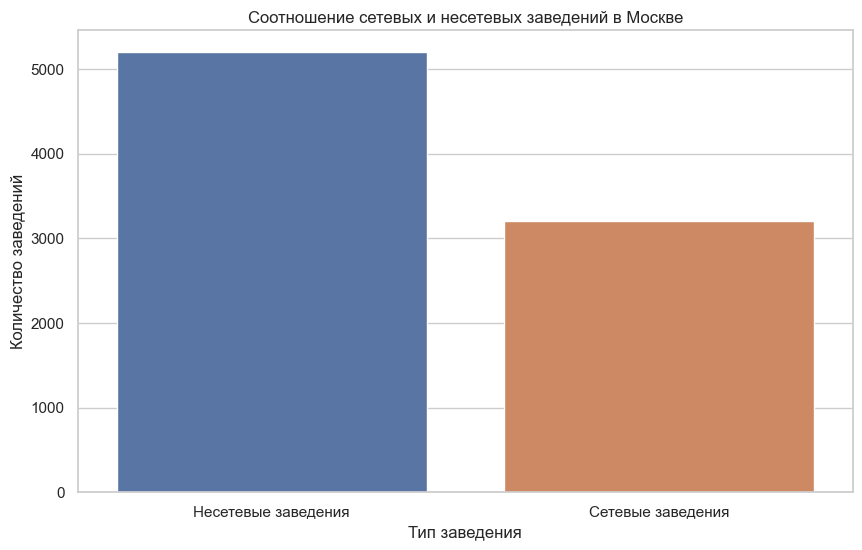

In [16]:
# Построение графика
plt.figure(figsize=(10, 6))
sns.barplot(x='chain', y='count', data=chain_counts)
plt.title('Соотношение сетевых и несетевых заведений в Москве')
plt.xlabel('Тип заведения')
plt.ylabel('Количество заведений')
plt.show()

В Москве преобладают несетевые заведения. Из общего числа 8402 заведений, 5199 (около 61.8%) являются несетевыми, в то время как 3203 (около 38.2%) - сетевыми. Это свидетельствует о высокой доле независимых заведений на рынке общественного питания Москвы.

### Какие категории заведений чаще являются сетевыми?

In [17]:
# Анализ количества сетевых и несетевых заведений по категориям
category_chain_counts = data.groupby(['category', 'chain']).size().unstack().fillna(0)
category_chain_counts.columns = ['Несетевые заведения', 'Сетевые заведения']
category_chain_counts

,Несетевые заведения,Сетевые заведения
category,,
"бар,паб",596,168
булочная,99,157
быстрое питание,371,232
кафе,1597,779
кофейня,693,720
пиццерия,303,330
ресторан,1313,729
столовая,227,88


In [18]:
# Нормализация для получения процента сетевых заведений в каждой категории
category_chain_percentage = category_chain_counts.div(category_chain_counts.sum(axis=1), axis=0) * 100
category_chain_percentage

,Несетевые заведения,Сетевые заведения
category,,
"бар,паб",78.01,21.99
булочная,38.67,61.33
быстрое питание,61.53,38.47
кафе,67.21,32.79
кофейня,49.04,50.96
пиццерия,47.87,52.13
ресторан,64.30,35.70
столовая,72.06,27.94


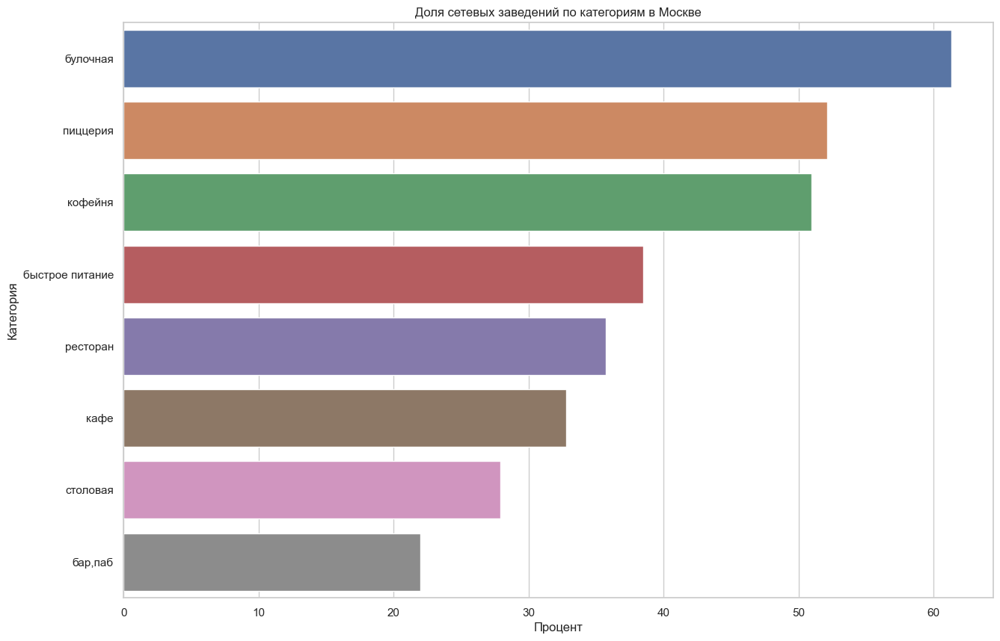

In [19]:
# Преобразование данных для построения графика
category_chain_percentage.reset_index(inplace=True)
category_chain_percentage_melted = category_chain_percentage.melt(id_vars='category', value_vars=['Несетевые заведения', 'Сетевые заведения'], var_name='Тип заведения', value_name='Процент')

# Фильтрация только для сетевых заведений
chain_only = category_chain_percentage_melted[category_chain_percentage_melted['Тип заведения'] == 'Сетевые заведения']

# Сортировка по убыванию процента сетевых заведений
chain_only_sorted = chain_only.sort_values(by='Процент', ascending=False)

# Построение графика
plt.figure(figsize=(15, 10))
sns.barplot(x='Процент', y='category', data=chain_only_sorted)
plt.title('Доля сетевых заведений по категориям в Москве')
plt.xlabel('Процент')
plt.ylabel('Категория')
plt.show()

Наибольшую долю сетевых заведений имеют булочные (61.33%), пиццерии (52.13%) и кофейни (50.96%). Несетевые заведения преобладают в таких категориях, как бары и пабы (78.01%), столовые (72.06%) и кафе (67.21%). Таким образом, булочные, пиццерии и кофейни чаще являются сетевыми, в то время как бары и пабы, столовые и кафе в большинстве своем несетевые.

### Топ-15 популярных сетей в Москве

Поскольку у некоторых сетей сразу несколько категорий, будем группировать сети по имени и категории. 

In [20]:
# Группировка данных по названию и категории, подсчет количества заведений
top_chains_detailed = data[data['chain'] == 1].groupby(['name', 'category']).size().reset_index(name='count')

# Выбор категории с наибольшим количеством заведений для каждой сети
top_chains_max = top_chains_detailed.loc[top_chains_detailed.groupby('name')['count'].idxmax()]

# Отбор топ-15 сетей по количеству заведений
top_15_chains = top_chains_max.sort_values(by='count', ascending=False).head(15)

# Сброс индексов
top_15_chains.reset_index(drop=True, inplace=True)
top_15_chains

,name,category,count
0,Шоколадница,кофейня,119
1,Домино'с Пицца,пиццерия,76
2,Додо Пицца,пиццерия,74
3,One Price Coffee,кофейня,71
4,Яндекс Лавка,ресторан,69
5,Cofix,кофейня,65
6,Prime,ресторан,49
7,КОФЕПОРТ,кофейня,42
8,Кулинарная лавка братьев Караваевых,кафе,39
9,Теремок,ресторан,36


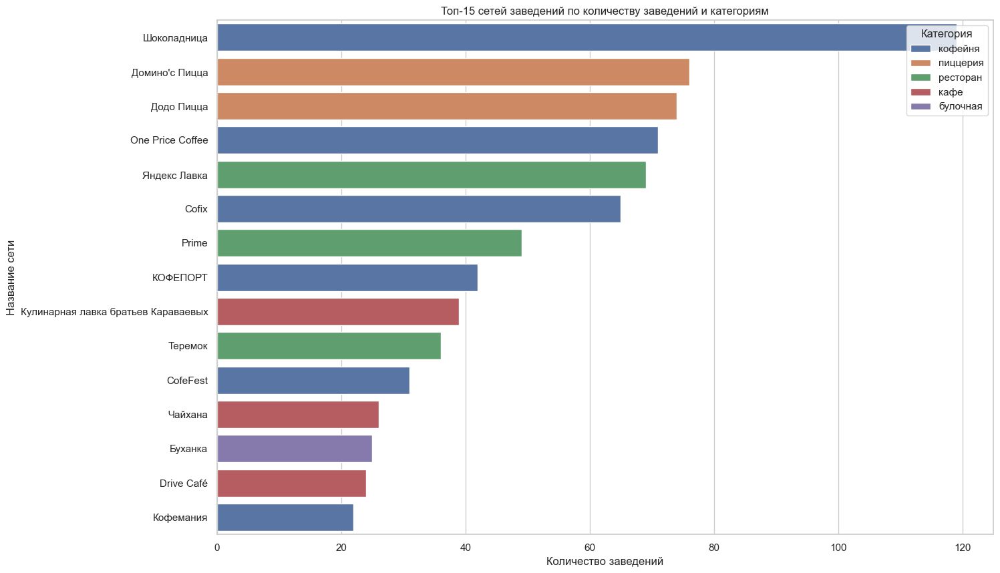

In [21]:
# Построение графика
plt.figure(figsize=(15, 10))
sns.barplot(x='count', y='name', hue='category', data=top_15_chains, dodge=False)
plt.title('Топ-15 сетей заведений по количеству заведений и категориям')
plt.xlabel('Количество заведений')
plt.ylabel('Название сети')
plt.legend(title='Категория', loc='upper right')
plt.show()

Среди топ-15 популярных сетей в Москве лидирует "Шоколадница" с 119 заведениями, относящимися к категории "кофейня". <br>
За ней следуют пиццерии "Домино'с Пицца" (76 заведений) и "Додо Пицца" (74 заведения). <br>
Кофейни также представлены такими сетями, как "One Price Coffee" (71 заведение), "Cofix" (65 заведений) и "КОФЕПОРТ" (42 заведения). <br>
В категорию ресторанов вошли "Яндекс Лавка" (69 заведений), "Prime" (49 заведений) и "Теремок" (36 заведений). <br>
Кафе включают "Кулинарную лавку братьев Караваевых" (39 заведений), "Чайхану" (26 заведений) и "Drive Café" (24 заведения). <br>
Также в топ-15 вошли "Буханка" (25 заведений, булочная) и "Кофемания" (22 заведения, кофейня). <br>

Эти данные показывают, что наиболее популярные сети в Москве представлены в основном кофейнями, пиццериями и ресторанами.

### Какие административные районы Москвы присутствуют в датасете?

In [22]:
# Подсчет общего количества заведений по районам
total_counts = data['district'].value_counts().reset_index()
total_counts.columns = ['district', 'total_count']
total_counts

,district,total_count
0,Центральный административный округ,2242
1,Северный административный округ,898
2,Южный административный округ,892
3,Северо-Восточный административный округ,890
4,Западный административный округ,850
5,Восточный административный округ,798
6,Юго-Восточный административный округ,714
7,Юго-Западный административный округ,709
8,Северо-Западный административный округ,409


In [23]:
# Подсчет количества заведений каждой категории по районам
district_category_counts = data.groupby(['district', 'category']).size().reset_index(name='count')

# Объединение данных
district_counts = pd.merge(district_category_counts, total_counts, on='district')

# Сортировка данных по общему количеству заведений
district_counts = district_counts.sort_values(by='total_count', ascending=False)
total_counts = total_counts.sort_values(by='total_count', ascending=False)

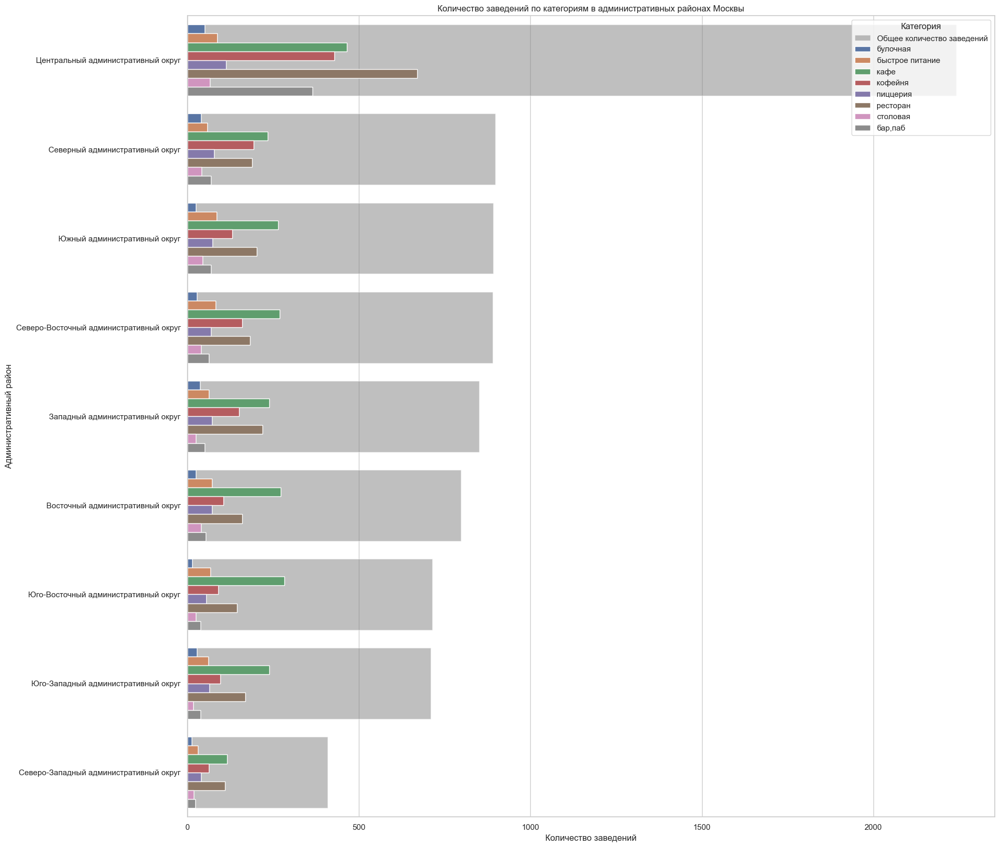

In [24]:
# Построение графика
plt.figure(figsize=(20, 20))
sns.barplot(x='total_count', y='district', data=total_counts, color='grey', alpha=0.5, label='Общее количество заведений')
sns.barplot(x='count', y='district', hue='category', data=district_counts)
plt.title('Количество заведений по категориям в административных районах Москвы')
plt.xlabel('Количество заведений')
plt.ylabel('Административный район')
plt.legend(title='Категория', loc='upper right')
plt.show()

Больше всего заведений общественного питания находится в Центральном административном округе (2242 заведения).<br>
За ним следуют Северный административный округ (898 заведений) и Южный административный округ (892 заведения).<br>
В Северо-Восточном административном округе насчитывается 890 заведение, в Западном - 850 заведение, а в Восточном - 798 заведений. <br>
Меньше всего заведений расположено в Юго-Восточном (714 заведений), Юго-Западном (709 заведений) и Северо-Западном (409 заведений) административных округах.

Эти данные показывают, что Центральный административный округ является наиболее насыщенным заведениями общественного питания районом, что может быть связано с высокой плотностью населения и деловой активностью в этом районе.

### Распределение средних рейтингов по категориям заведений

In [25]:
# Подсчет среднего рейтинга по категориям
category_ratings = data.groupby('category')['rating'].mean().reset_index()

# Сортировка данных по рейтингу от большего к меньшему
category_ratings = category_ratings.sort_values(by='rating', ascending=False)
category_ratings

,category,rating
0,"бар,паб",4.39
5,пиццерия,4.30
6,ресторан,4.29
4,кофейня,4.28
1,булочная,4.27
7,столовая,4.21
3,кафе,4.12
2,быстрое питание,4.05


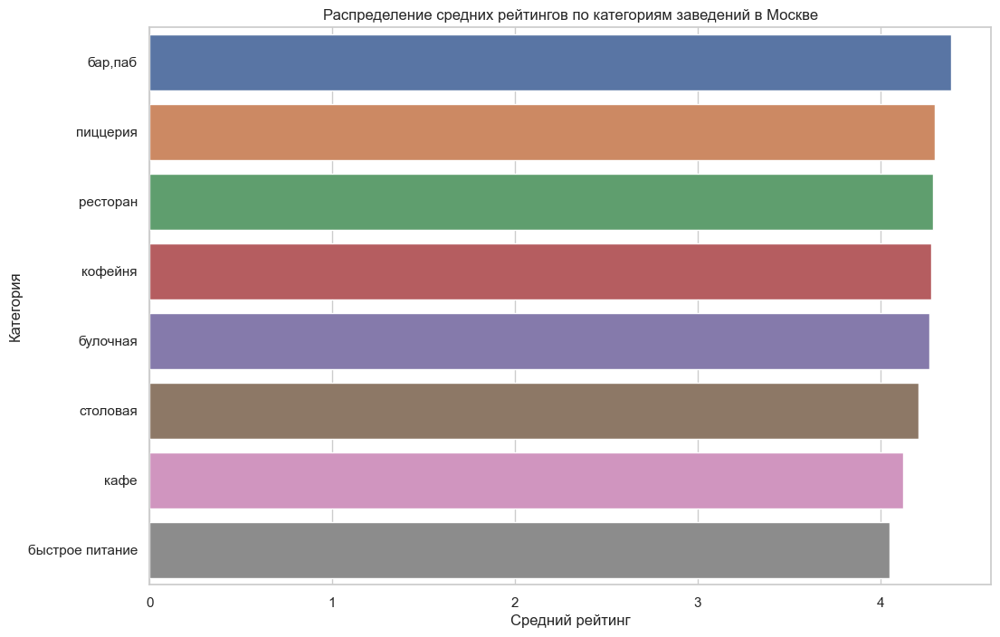

In [26]:
# Построение графика
plt.figure(figsize=(12, 8))
sns.barplot(x='rating', y='category', data=category_ratings)
plt.title('Распределение средних рейтингов по категориям заведений в Москве')
plt.xlabel('Средний рейтинг')
plt.ylabel('Категория')
plt.show()

Наивысший средний рейтинг среди категорий заведений имеют бары и пабы (4.39).<br> 
Следом за ними идут пиццерии (4.30) и рестораны (4.29).<br>
Кофейни также имеют высокий средний рейтинг (4.28), за ними идут булочные (4.27). <br>
Столовые имеют средний рейтинг 4.21, кафе - 4.12, и наименьший средний рейтинг среди категорий заведений у заведений быстрого питания (4.05). <br>

Различия в средних рейтингах между категориями не являются значительными, что может свидетельствовать о сравнительно высоком уровне обслуживания и качества в различных типах заведений общественного питания в Москве.

### Средний рейтинг заведений каждого района

In [27]:
# Читаем файл с границами районов Москвы
with open('admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

In [28]:
# Вычисление среднего рейтинга по районам
district_ratings = data.groupby('district')['rating'].mean().reset_index()

# Сортировка данных по рейтингу от большего к меньшему
district_ratings = district_ratings.sort_values(by='rating', ascending=False)
district_ratings

,district,rating
5,Центральный административный округ,4.38
2,Северный административный округ,4.24
4,Северо-Западный административный округ,4.21
8,Южный административный округ,4.18
1,Западный административный округ,4.18
0,Восточный административный округ,4.17
7,Юго-Западный административный округ,4.17
3,Северо-Восточный административный округ,4.15
6,Юго-Восточный административный округ,4.10


In [29]:
# Создание фоновой картограммы
fig = px.choropleth_mapbox(district_ratings, geojson=geo_json, locations='district', featureidkey="properties.name",
                           color='rating', color_continuous_scale="Viridis",
                           mapbox_style="carto-positron", zoom=10, center={"lat": 55.751244, "lon": 37.618423},
                           opacity=0.5, labels={'rating': 'Средний рейтинг'})

fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

Наивысший средний рейтинг заведений среди административных округов Москвы имеет Центральный административный округ (4.38). <br>
За ним следуют Северный административный округ (4.24) и Северо-Западный административный округ (4.21).<br>
Рейтинг заведений в Восточном и Юго-Западном административных округах составляет 4.17, а в Западном и Южном административных округах - 4.18. <br>
Северо-Восточный административный округ имеет средний рейтинг 4.15, а наименьший средний рейтинг наблюдается в Юго-Восточном административном округе (4.10). <br>

Эти различия указывают на небольшое варьирование уровня обслуживания и качества заведений в различных районах Москвы.

### Все заведения датасета на карте

In [59]:
# Создание карты
m = folium.Map(location=[55.751244, 37.618423], zoom_start=10)

# Создание кластеров
marker_cluster = MarkerCluster().add_to(m)

# Добавление маркеров на карту
for idx, row in data.iterrows():
    folium.Marker(location=[row['lat'], row['lng']], 
                  popup=f"{row['name']}<br>Рейтинг: {row['rating']}<br>Адрес: {row['address']}").add_to(marker_cluster)
m

### Топ-15 улиц по количеству заведений

In [31]:
# Подсчет количества заведений по улицам
top_streets = data['street'].value_counts().head(15).reset_index()
top_streets.columns = ['street', 'count']
top_streets

,street,count
0,проспект Мира,183
1,Профсоюзная улица,122
2,проспект Вернадского,108
3,Ленинский проспект,107
4,Ленинградский проспект,95
5,Дмитровское шоссе,88
6,Каширское шоссе,77
7,Варшавское шоссе,76
8,Ленинградское шоссе,70
9,МКАД,65


In [32]:
# Фильтрация данных по топ-15 улицам
top_streets_data = data[data['street'].isin(top_streets['street'])]

# Подсчет количества заведений по категориям для топ-15 улиц
street_category_counts = top_streets_data.groupby(['street', 'category']).size().reset_index(name='count')

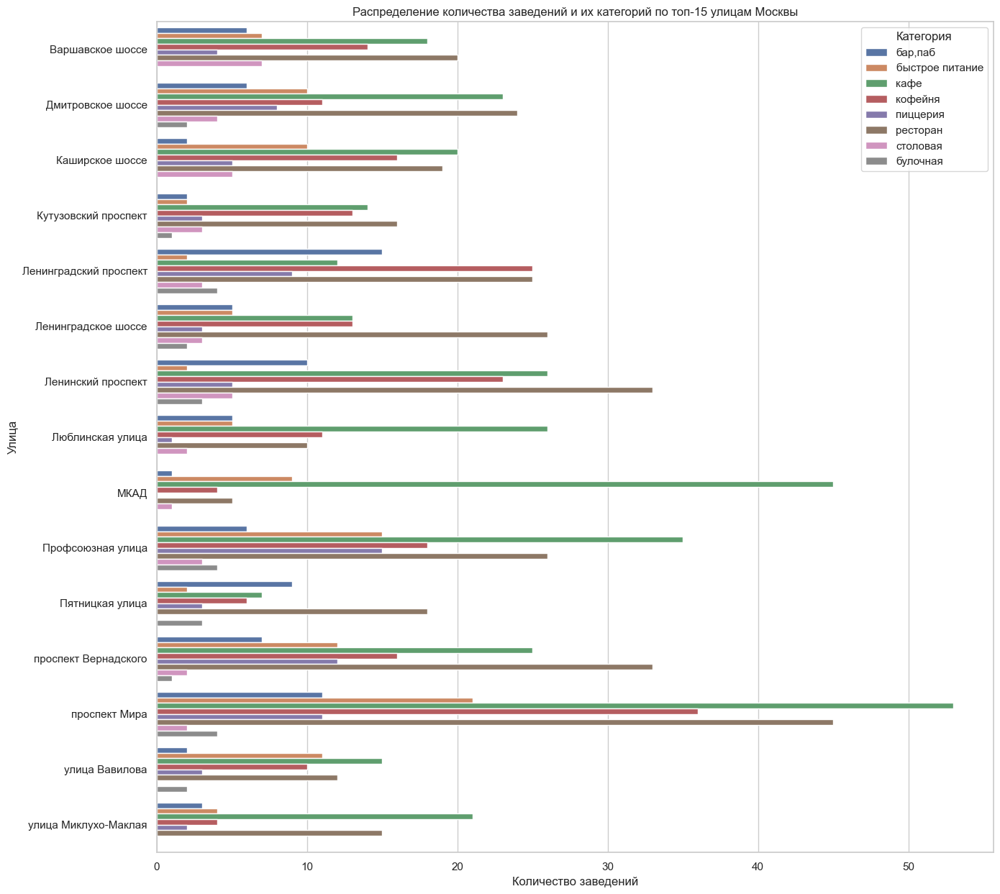

In [33]:
# Построение графика
plt.figure(figsize=(15, 15))
sns.barplot(x='count', y='street', hue='category', data=street_category_counts)
plt.title('Распределение количества заведений и их категорий по топ-15 улицам Москвы')
plt.xlabel('Количество заведений')
plt.ylabel('Улица')
plt.legend(title='Категория', loc='upper right')
plt.show()

Наибольшее количество заведений общественного питания расположено на проспекте Мира (183 заведения). За ним следуют Профсоюзная улица (122 заведения) и проспект Вернадского (108 заведений). Ленинский проспект (107 заведений) и Ленинградский проспект (95 заведений) также входят в топ-5 улиц с наибольшим количеством заведений.

Наименьшее количество заведений среди топ-15 улиц имеют Кутузовский проспект (54 заведения), улица Миклухо-Маклая (49 заведений) и Пятницкая улица (48 заведений).

### Улицы, на которых находится только один объект общепита

In [34]:
# Подсчет количества заведений по улицам
street_counts = data['street'].value_counts()

# Фильтрация улиц, на которых находится только один объект общепита
one_object_streets = street_counts[street_counts == 1].index

# Фильтрация данных по этим улицам
one_object_data = data[data['street'].isin(one_object_streets)]

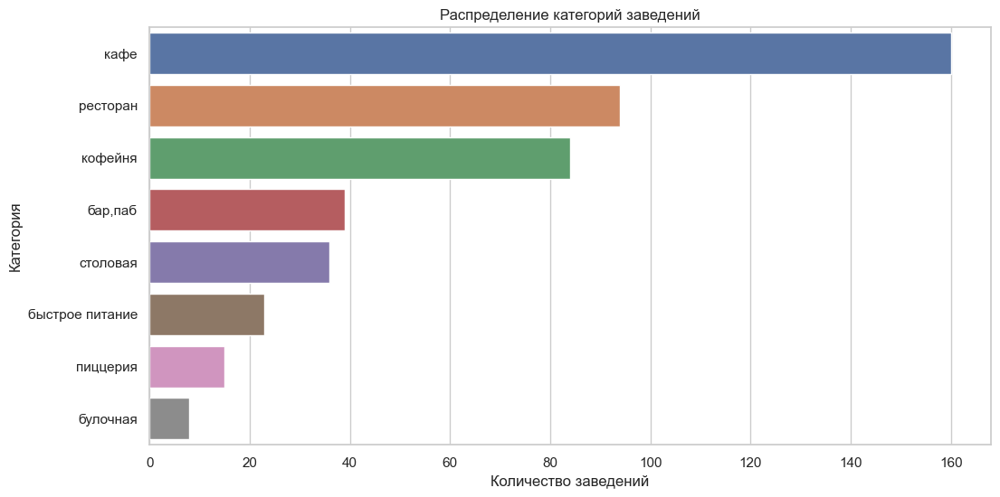

In [35]:
# 1. Распределение категорий заведений
plt.figure(figsize=(12, 6))
sns.countplot(data=one_object_data, y='category', order=one_object_data['category'].value_counts().index)
plt.title('Распределение категорий заведений')
plt.xlabel('Количество заведений')
plt.ylabel('Категория')
plt.show()

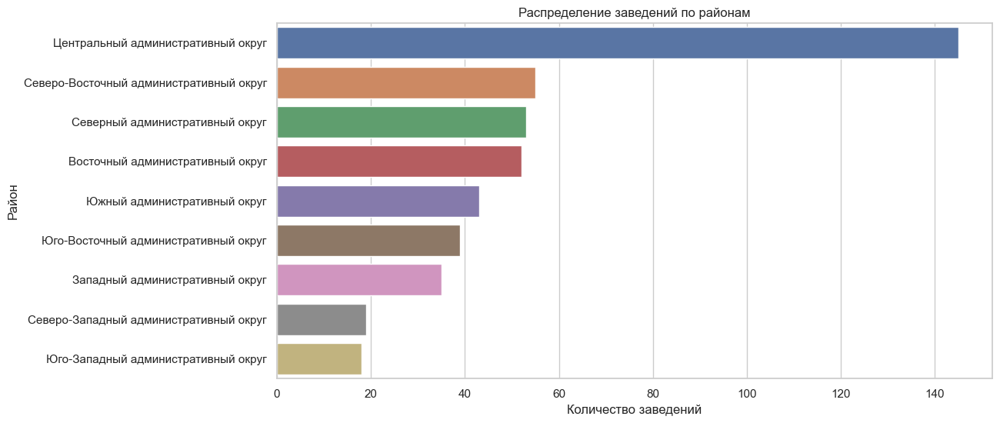

In [36]:
# 2. Распределение по районам
plt.figure(figsize=(12, 6))
sns.countplot(data=one_object_data, y='district', order=one_object_data['district'].value_counts().index)
plt.title('Распределение заведений по районам')
plt.xlabel('Количество заведений')
plt.ylabel('Район')
plt.show()

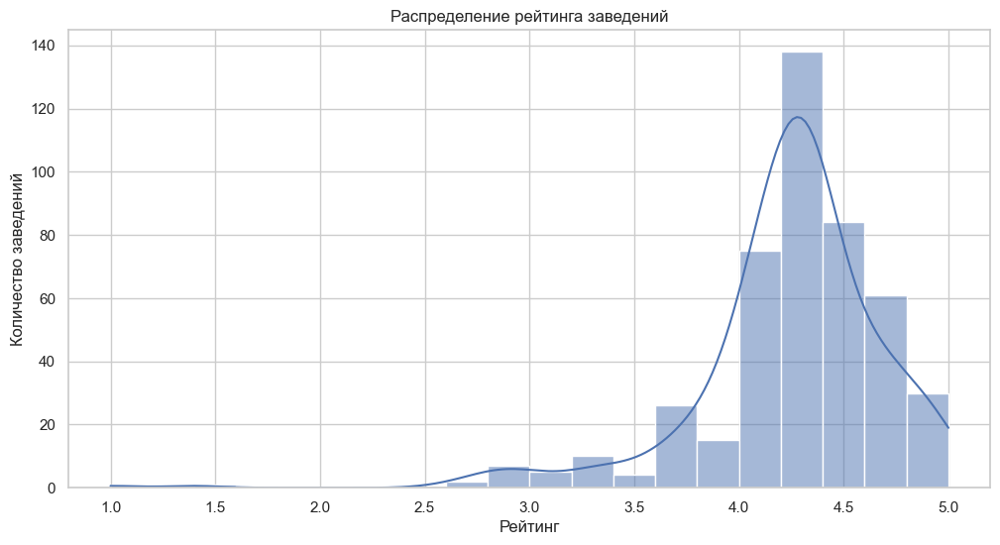

In [37]:
# 3. Распределение рейтинга
plt.figure(figsize=(12, 6))
sns.histplot(data=one_object_data, x='rating', bins=20, kde=True)
plt.title('Распределение рейтинга заведений')
plt.xlabel('Рейтинг')
plt.ylabel('Количество заведений')
plt.show()

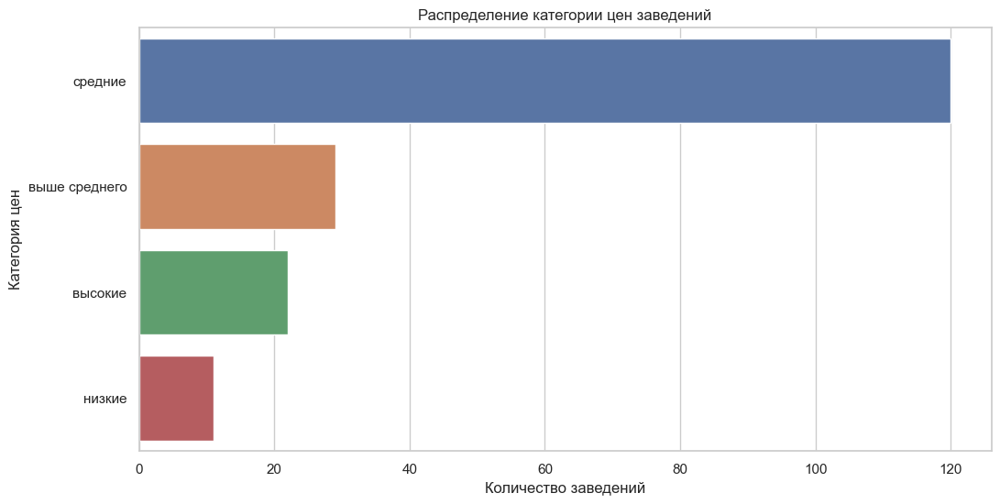

In [38]:
# 4. Распределение категории цен
plt.figure(figsize=(12, 6))
sns.countplot(data=one_object_data, y='price', order=one_object_data['price'].value_counts().index)
plt.title('Распределение категории цен заведений')
plt.xlabel('Количество заведений')
plt.ylabel('Категория цен')
plt.show()

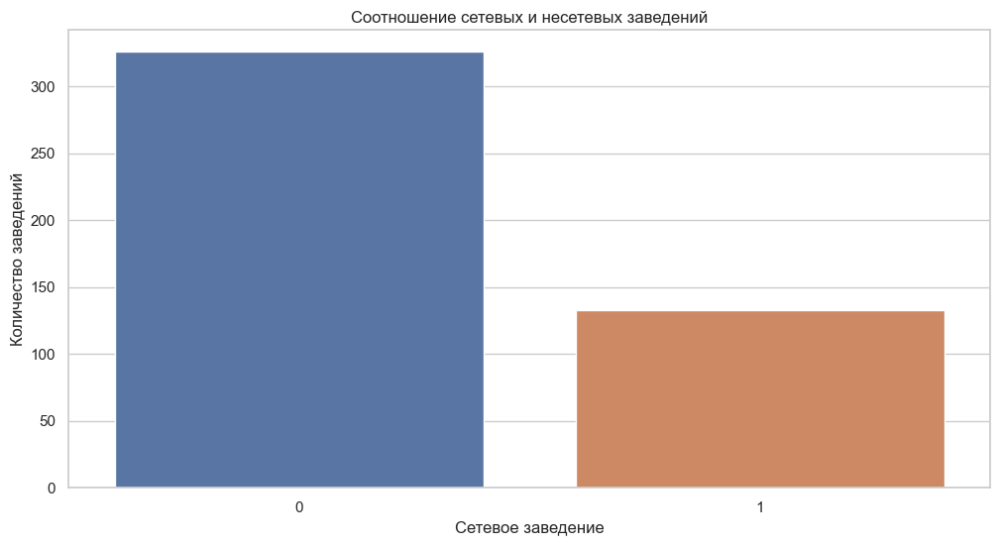

In [39]:
# 5. Соотношение сетевых и несетевых заведений
plt.figure(figsize=(12, 6))
sns.countplot(data=one_object_data, x='chain')
plt.title('Соотношение сетевых и несетевых заведений')
plt.xlabel('Сетевое заведение')
plt.ylabel('Количество заведений')
plt.show()

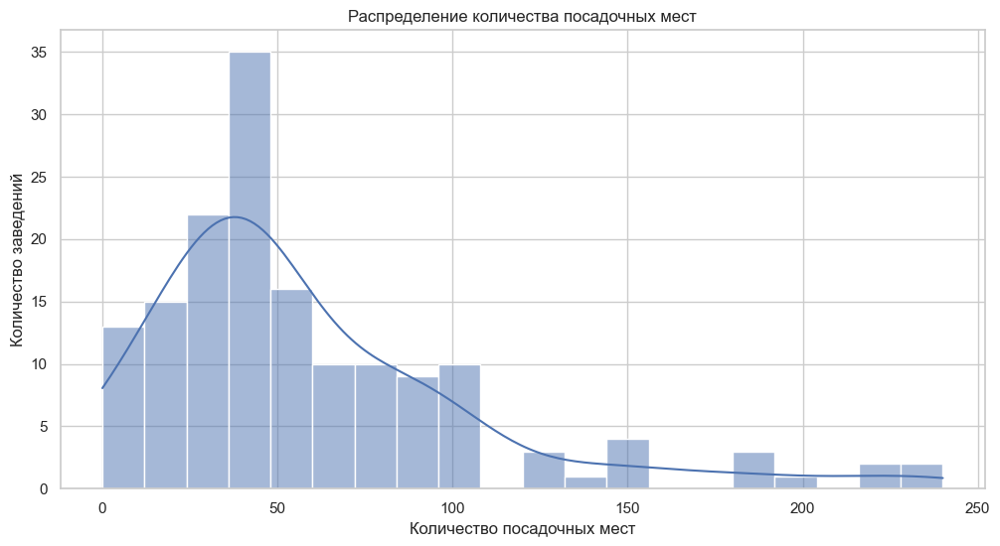

In [40]:
# 6. Распределение количества посадочных мест
plt.figure(figsize=(12, 6))
sns.histplot(data=one_object_data, x='seats', bins=20, kde=True)
plt.title('Распределение количества посадочных мест')
plt.xlabel('Количество посадочных мест')
plt.ylabel('Количество заведений')
plt.show()

Эти визуализации помогают понять, что заведения на улицах с одним объектом общепита чаще всего являются небольшими, уникальными кафе или ресторанами, расположенными преимущественно в центральной части города и предлагающими услуги среднего ценового сегмента.

### Медиана средних чеков заведений для каждого района

In [41]:
# Посчитаем медиану среднего чека для каждого района
median_bills = data.groupby('district')['middle_avg_bill'].median().reset_index()

# Сортировка данных по медиане от большего к меньшему
median_bills = median_bills.sort_values(by='middle_avg_bill', ascending=False)
median_bills

,district,middle_avg_bill
1,Западный административный округ,"1,000.00"
5,Центральный административный округ,"1,000.00"
4,Северо-Западный административный округ,700.00
2,Северный административный округ,650.00
7,Юго-Западный административный округ,600.00
0,Восточный административный округ,575.00
3,Северо-Восточный административный округ,500.00
8,Южный административный округ,500.00
6,Юго-Восточный административный округ,450.00


In [42]:
# Создание фоновой картограммы
fig = px.choropleth_mapbox(median_bills, geojson=geo_json, locations='district', featureidkey="properties.name",
                           color='middle_avg_bill', color_continuous_scale="Viridis",
                           mapbox_style="carto-positron", zoom=10, center={"lat": 55.751244, "lon": 37.618423},
                           opacity=0.5, labels={'middle_avg_bill': 'Медиана среднего чека'})

fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

На основании медианных значений среднего чека в заведениях по районам Москвы видно, что Центральный и Западный административные округа имеют наивысшие цены (1000 руб.), тогда как остальные районы показывают значительно более низкие медианные значения. Самые низкие медианные значения среднего чека наблюдаются в Юго-Восточном административном округе (450 руб.). Анализ показывает, что чем ближе район к центру, тем выше цены в заведениях, что скорее всего связано с большей привлекательностью и престижностью центральных районов для посетителей.

### Вывод по разделу

Таким образом, в Москве наиболее популярной категорией заведений общественного питания являются кафе (2376 заведений), что может свидетельствовать о популярности неформальных мест для встреч и отдыха. Рестораны занимают второе место (2042 заведения), что указывает на высокий спрос на более формальные заведения для еды. Кофейни также довольно популярны (1413 заведений), что отражает тренд на рост потребления кофе и связанных с этим культурных аспектов. Центральный административный округ является наиболее насыщенным заведениями общепита районом с 2242 заведениями, что связано с высокой плотностью населения и деловой активностью.

Несетевые заведения преобладают в Москве (61.8%), особенно в таких категориях, как бары и пабы (78.01%), столовые (72.06%) и кафе (67.21%). В то же время, булочные, пиццерии и кофейни чаще являются сетевыми. Самые популярные сети включают "Шоколадницу", "Домино'с Пицца" и "Додо Пицца". Различия в средних рейтингах между категориями незначительны, что может свидетельствовать о высоком уровне обслуживания и качества в различных типах заведений. Наивысший средний рейтинг среди административных округов имеет Центральный административный округ (4.38), что указывает на высокий уровень обслуживания и качества заведений в центре Москвы.

Заведения на улицах с одним объектом общепита чаще всего являются небольшими, уникальными кафе или ресторанами, расположенными преимущественно в центральной части города и предлагающими услуги среднего ценового сегмента. Центральный административный округ имеет наивысшие медианные значения среднего чека (1000 руб.), что свидетельствует о более высоких ценах в центре по сравнению с другими районами. Самые низкие медианные значения среднего чека наблюдаются в Юго-Восточном административном округе (450 руб.), что демонстрирует более доступные цены в удаленных от центра районах. В целом, чем ближе район к центру, тем выше цены в заведениях, что связано с престижностью и привлекательностью центра Москвы.

## Детализируем исследование: открытие кофейни

Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуем определить, осуществима ли мечта клиентов.

### Общая информация о кофейнях

In [43]:
# Фильтруем данные для кофеен
coffee_shops = data[data['category'] == 'кофейня']

In [44]:
# Количество кофеен
coffee_shops.shape[0]

1413

In [45]:
# Распределение кофеен по районам
coffee_shops_by_district = coffee_shops['district'].value_counts().reset_index()
coffee_shops_by_district.columns = ['district', 'count']

In [46]:
# Особенности расположения кофеен
district_summary = coffee_shops.groupby('district').agg({
    'rating': 'mean',
    'middle_avg_bill': 'median',
    'seats': 'mean'
}).reset_index()

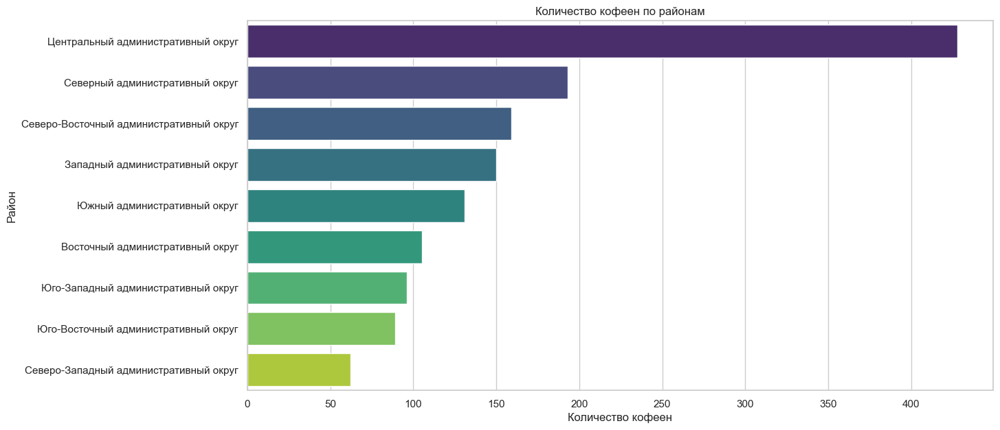

In [47]:
# Гистограмма количества кофеен по районам
plt.figure(figsize=(14, 7))
sns.barplot(x='count', y='district', data=coffee_shops_by_district, palette='viridis')
plt.xlabel('Количество кофеен')
plt.ylabel('Район')
plt.title('Количество кофеен по районам')
plt.show()

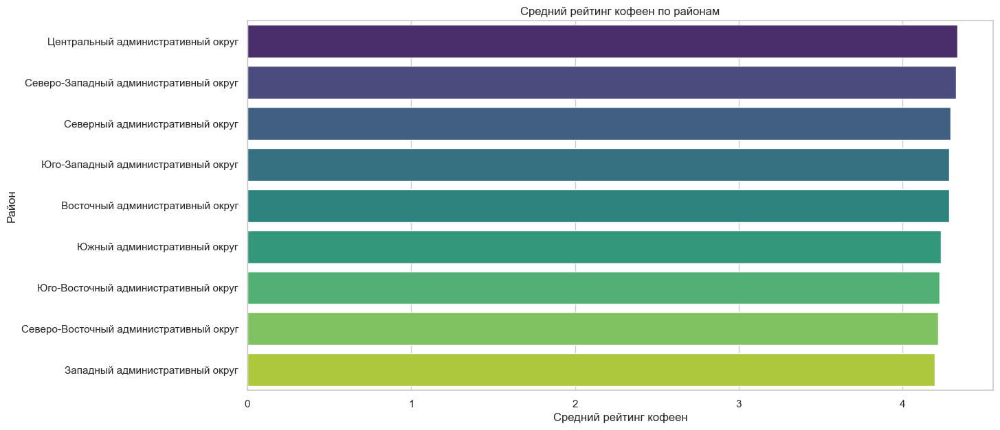

In [48]:
# Сортировка по среднему рейтингу
district_summary = district_summary.sort_values(by='rating', ascending=False)

# График среднего рейтинга кофеен по районам
plt.figure(figsize=(14, 7))
sns.barplot(x='rating', y='district', data=district_summary, palette='viridis')
plt.xlabel('Средний рейтинг кофеен')
plt.ylabel('Район')
plt.title('Средний рейтинг кофеен по районам')
plt.show()

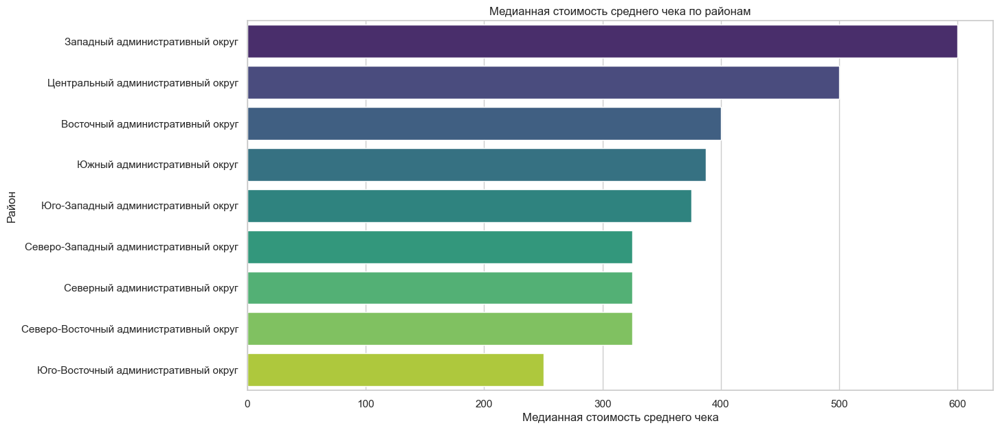

In [49]:
# Сортировка по медиане среднего чека
district_summary = district_summary.sort_values(by='middle_avg_bill', ascending=False)

# График медианной стоимости среднего чека по районам
plt.figure(figsize=(14, 7))
sns.barplot(x='middle_avg_bill', y='district', data=district_summary, palette='viridis')
plt.xlabel('Медианная стоимость среднего чека')
plt.ylabel('Район')
plt.title('Медианная стоимость среднего чека по районам')
plt.show()

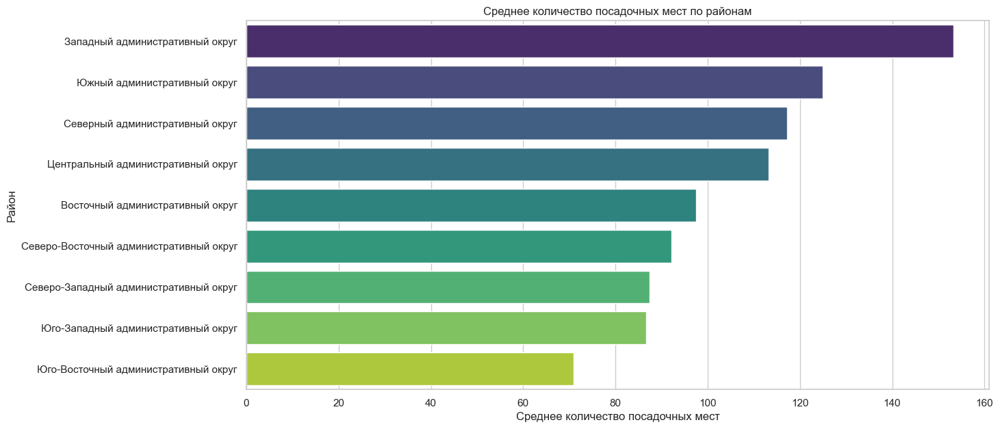

In [50]:
# Сортировка по среднему количеству посадочных мест
district_summary = district_summary.sort_values(by='seats', ascending=False)

# График среднего количества посадочных мест по районам
plt.figure(figsize=(14, 7))
sns.barplot(x='seats', y='district', data=district_summary, palette='viridis')
plt.xlabel('Среднее количество посадочных мест')
plt.ylabel('Район')
plt.title('Среднее количество посадочных мест по районам')
plt.show()

Всего в Москве 1413 кофеен. Наибольшее количество кофеен сосредоточено в Центральном административном округе Москвы, где высока деловая активность и туристический поток, а также наблюдается высокий уровень обслуживания и качества. Западный и Центральный административные округа выделяются высокой медианной стоимостью среднего чека и большим количеством посадочных мест. Эти данные указывают на привлекательность центральных и некоторых периферийных районов для открытия новых кофеен, несмотря на высокую конкуренцию.

### Круглосуточные кофейни

Количество круглосуточных кофеен в Москве: 59


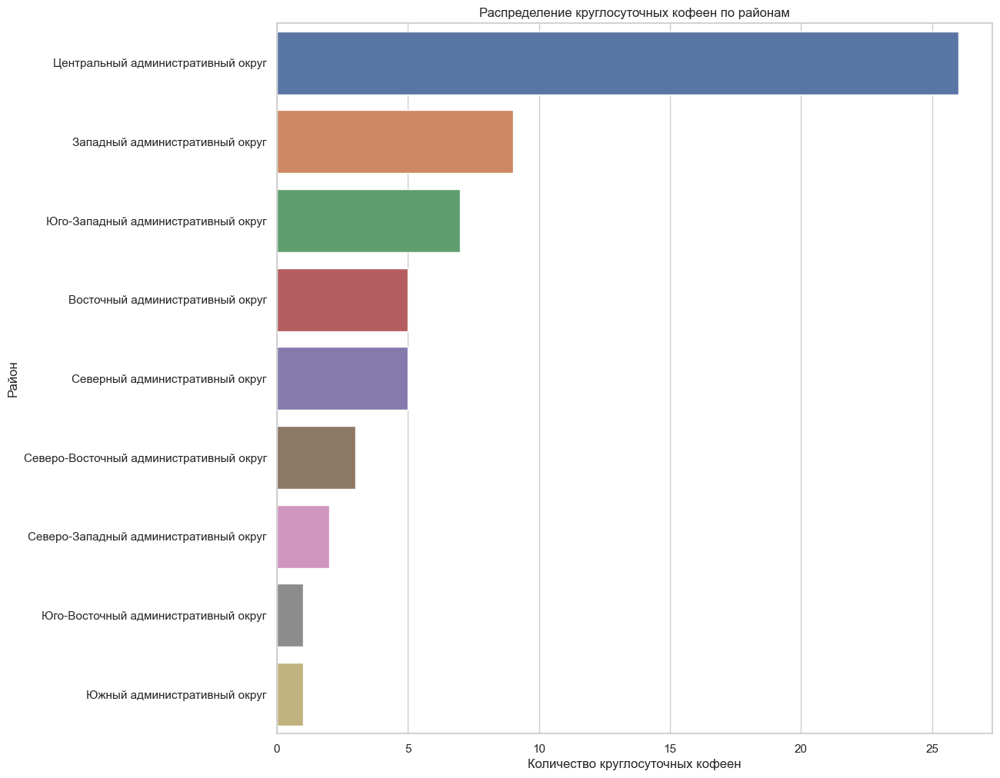

In [51]:
# Фильтрация кофеен
coffee_shops_24_7 = coffee_shops[coffee_shops['is_24_7'] == True]

# Подсчет количества круглосуточных кофеен
num_24_7_coffee_shops = coffee_shops_24_7.shape[0]
print(f"Количество круглосуточных кофеен в Москве: {num_24_7_coffee_shops}")

# Распределение круглосуточных кофеен по районам
district_24_7_distribution = coffee_shops_24_7['district'].value_counts()

# Визуализация
plt.figure(figsize=(12, 12))
sns.barplot(x=district_24_7_distribution.values, y=district_24_7_distribution.index)
plt.xlabel('Количество круглосуточных кофеен')
plt.ylabel('Район')
plt.title('Распределение круглосуточных кофеен по районам')
# plt.xticks(rotation=45)
plt.show()

В Москве насчитывается 59 круглосуточные кофейни. Большинство из них расположено в Центральном административном округе, что может свидетельствовать о высоком спросе на такие заведения в центре города. Западный административный округ и Юго-Западный административный округ также имеют значительное количество круглосуточных кофеен, а в других округах их значительно меньше.

### Рейтинги кофеен

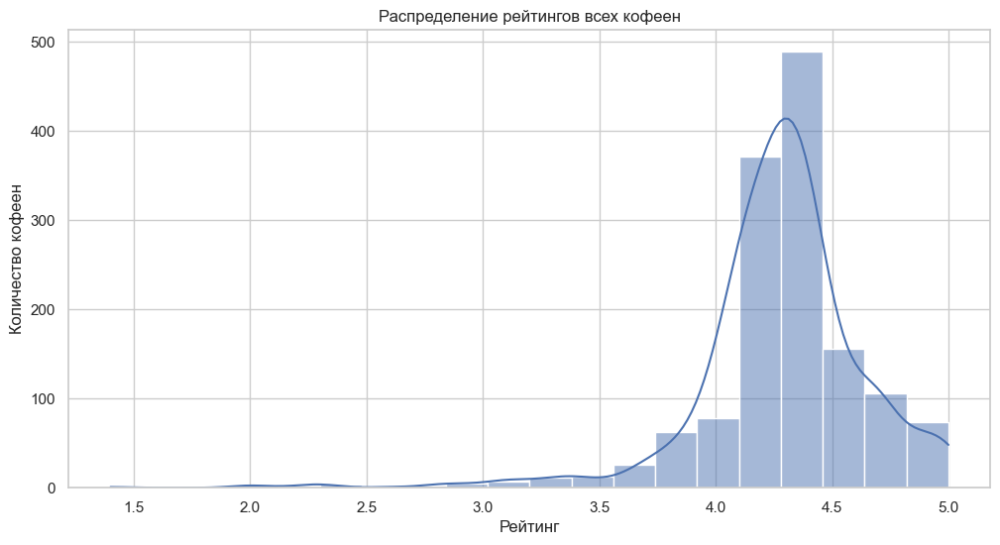

In [52]:
# Гистограмма распределения рейтингов всех кофеен
plt.figure(figsize=(12, 6))
sns.histplot(coffee_shops['rating'], bins=20, kde=True)
plt.title('Распределение рейтингов всех кофеен')
plt.xlabel('Рейтинг')
plt.ylabel('Количество кофеен')
plt.show()

In [53]:
# Группировка данных по районам и вычисление среднего рейтинга
ratings_by_district = coffee_shops.groupby('district')['rating'].describe().reset_index()
ratings_by_district

,district,count,mean,std,min,25%,50%,75%,max
0,Восточный административный округ,105.00,4.28,0.38,3.00,4.10,4.30,4.40,5.00
1,Западный административный округ,150.00,4.20,0.36,2.30,4.03,4.20,4.38,5.00
2,Северный административный округ,193.00,4.29,0.44,2.00,4.10,4.30,4.50,5.00
3,Северо-Восточный административный округ,159.00,4.22,0.43,1.40,4.10,4.30,4.40,5.00
4,Северо-Западный административный округ,62.00,4.33,0.43,2.00,4.20,4.30,4.50,5.00
5,Центральный административный округ,428.00,4.34,0.26,2.30,4.20,4.30,4.40,5.00
6,Юго-Восточный административный округ,89.00,4.23,0.51,2.30,4.10,4.30,4.50,5.00
7,Юго-Западный административный округ,96.00,4.28,0.30,3.30,4.10,4.30,4.50,5.00
8,Южный административный округ,131.00,4.23,0.39,2.00,4.10,4.30,4.40,5.00


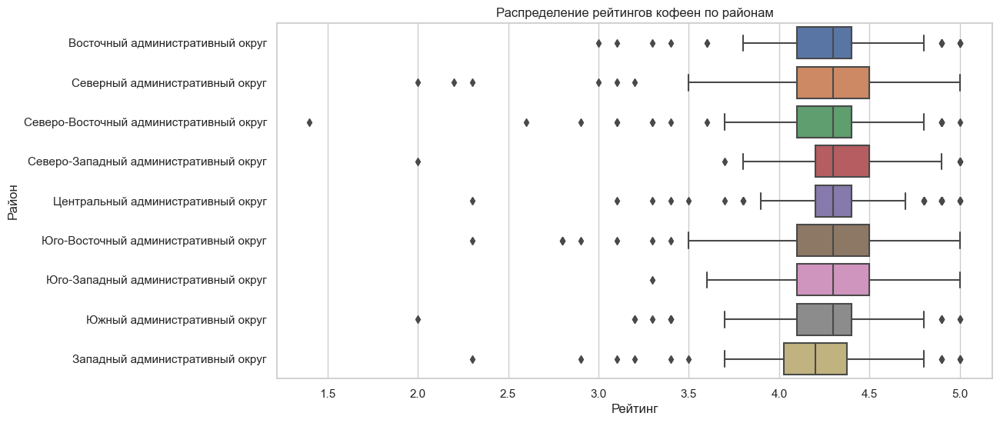

In [54]:
# Сортировка по медиане рейтинга
ratings_by_district = ratings_by_district.sort_values(by='50%', ascending=False)

# Сохранение порядка районов после сортировки
ordered_districts = ratings_by_district['district']

# Построение boxplot с распределением рейтингов и сортировкой по медиане
plt.figure(figsize=(12, 6))
sns.boxplot(data=coffee_shops, x='rating', y='district', order=ordered_districts)
plt.title('Распределение рейтингов кофеен по районам')
plt.xlabel('Рейтинг')
plt.ylabel('Район')
plt.show()

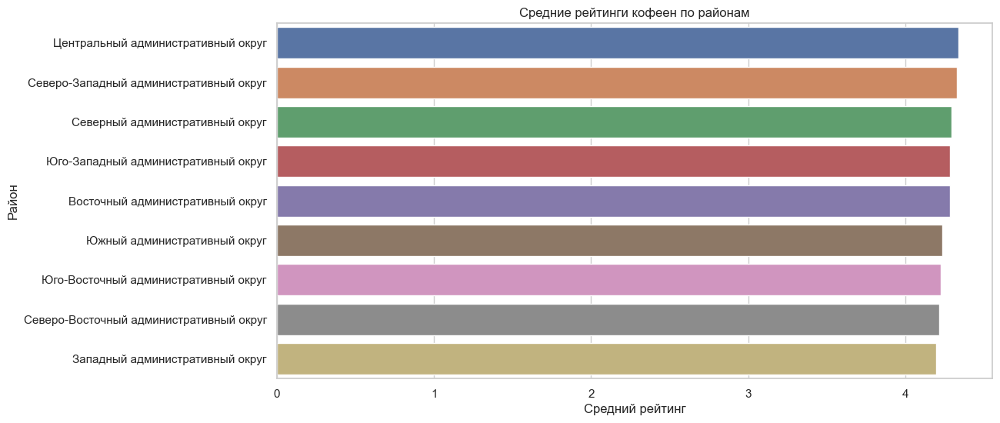

In [55]:
# Вычисление среднего рейтинга по районам
mean_ratings_by_district = coffee_shops.groupby('district')['rating'].mean().sort_values(ascending=False).reset_index()

# Сохранение порядка районов после сортировки
ordered_districts = mean_ratings_by_district['district']

# Построение barplot со средними рейтингами по районам с сортировкой
plt.figure(figsize=(12, 6))
sns.barplot(data=coffee_shops, x='rating', y='district', order=ordered_districts, ci=None)
plt.title('Средние рейтинги кофеен по районам')
plt.xlabel('Средний рейтинг')
plt.ylabel('Район')
plt.show()

В целом, кофейни в Москве имеют высокие рейтинги, большинство из них находятся в диапазоне 4.0 - 4.5. Средний рейтинг кофеен по районам варьируется незначительно, что говорит о сравнительно высоком уровне обслуживания и качестве в различных районах. Наивысший средний рейтинг наблюдается в Северо-Западном административном округе (4.33) и Центральном административном округе (4.34), что свидетельствует о высоком качестве услуг в этих районах. Наименьший средний рейтинг отмечается в Западном административном округе (4.20), что также является достаточно высоким показателем.

Таким образом, можно сказать, что кофейни в Москве в целом предоставляют качественные услуги, вне зависимости от района, в котором они расположены.

### На какую стоимость чашки капучино стоит ориентироваться при открытии?

In [56]:
# Вычисление средней и медианной стоимости чашки капучино по районам
mean_coffee_price = coffee_shops.groupby('district')['middle_coffee_cup'].mean().reset_index()
median_coffee_price = coffee_shops.groupby('district')['middle_coffee_cup'].median().reset_index()

# Переименование столбцов для ясности
mean_coffee_price.columns = ['district', 'mean_coffee_cup']
median_coffee_price.columns = ['district', 'median_coffee_cup']

# Слияние средней и медианной стоимости в один DataFrame
coffee_prices = pd.merge(mean_coffee_price, median_coffee_price, on='district')

print("Средняя и медианная стоимость чашки капучино по районам:")
coffee_prices

Средняя и медианная стоимость чашки капучино по районам:


,district,mean_coffee_cup,median_coffee_cup
0,Восточный административный округ,174.02,135.00
1,Западный административный округ,189.94,189.00
2,Северный административный округ,165.79,159.00
3,Северо-Восточный административный округ,165.33,162.50
4,Северо-Западный административный округ,165.52,165.00
5,Центральный административный округ,187.52,190.00
6,Юго-Восточный административный округ,151.09,147.50
7,Юго-Западный административный округ,184.18,198.00
8,Южный административный округ,158.49,150.00


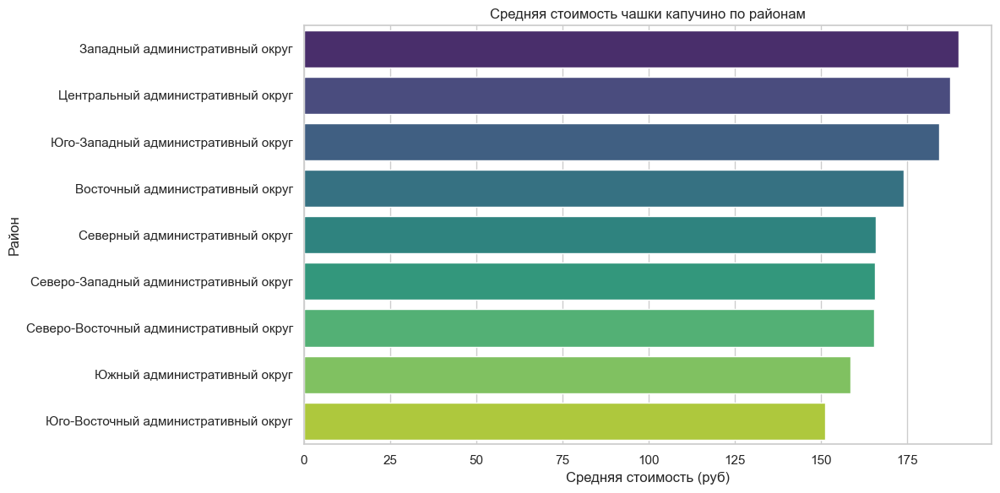

In [57]:
# Сортировка по средней стоимости чашки капучино
sorted_by_mean = coffee_prices.sort_values(by='mean_coffee_cup', ascending=False)
ordered_districts_by_mean = sorted_by_mean['district']

# График средней стоимости капучино
plt.figure(figsize=(12, 6))
sns.barplot(x='mean_coffee_cup', y='district', data=sorted_by_mean, palette='viridis', order=ordered_districts_by_mean)
plt.title('Средняя стоимость чашки капучино по районам')
plt.xlabel('Средняя стоимость (руб)')
plt.ylabel('Район')
plt.tight_layout()
plt.show()

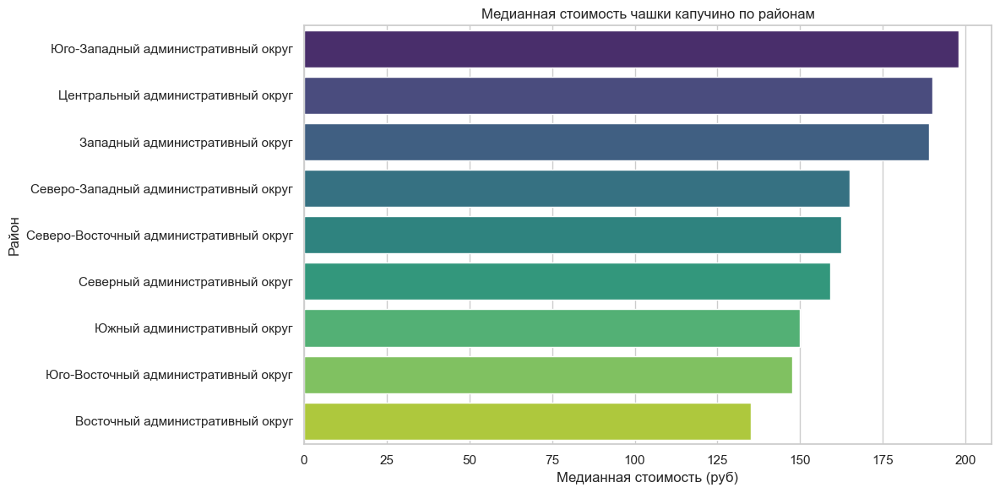

In [58]:
# Сортировка по медианной стоимости чашки капучино
sorted_by_median = coffee_prices.sort_values(by='median_coffee_cup', ascending=False)
ordered_districts_by_median = sorted_by_median['district']

# График медианной стоимости капучино
plt.figure(figsize=(12, 6))
sns.barplot(x='median_coffee_cup', y='district', data=sorted_by_median, palette='viridis', order=ordered_districts_by_median)
plt.title('Медианная стоимость чашки капучино по районам')
plt.xlabel('Медианная стоимость (руб)')
plt.ylabel('Район')
plt.tight_layout()
plt.show()

Средняя и медианная стоимость чашки капучино варьируется в разных районах Москвы.<br>
Самая высокая средняя стоимость чашки капучино наблюдается в Западном административном округе (189.94 руб.), в то время как наименьшая – в Юго-Восточном административном округе (151.09 руб.). Медианная стоимость чашки капучино также демонстрирует значительные различия: наивысшая медианная стоимость отмечена в Юго-западном административном округе (198.00 руб.), а самая низкая – в Юго-Восточном административном округе (135.00 руб.).

При открытии новой кофейни в Москве стоит ориентироваться на среднюю стоимость чашки капучино в районе 160-190 рублей. Такой диапазон цен соответствует средним и медианным значениям в наиболее престижных и востребованных районах, таких как Центральный и Восточный административные округа, где высокая деловая активность и туристический поток. Установление цены в этом диапазоне позволит соответствовать ожиданиям клиентов в этих районах и поддерживать конкурентоспособность на высококачественном рынке.

###  Рекомендация для открытия нового заведения

В Москве всего 1413 кофеен, с наибольшей концентрацией в Центральном административном округе, где высока деловая активность и туристический поток, а также высокий уровень обслуживания и качества. Восточный и Западный административные округа выделяются высокой медианной стоимостью среднего чека и большим количеством посадочных мест, что указывает на привлекательность этих районов для открытия новых кофеен, несмотря на высокую конкуренцию.

В Москве насчитывается 59 круглосуточные кофейни, большинство из которых расположены в Центральном административном округе, что свидетельствует о высоком спросе на такие заведения в центре города. Западный и Юго-Западный административные округа также имеют значительное количество круглосуточных кофеен.

Кофейни в Москве имеют высокие рейтинги, большинство из них находятся в диапазоне 4.0 - 4.5. Средний рейтинг кофеен по районам варьируется незначительно, что говорит о высоком уровне обслуживания и качестве в различных районах. Наивысший средний рейтинг наблюдается в Северо-Западном и Центральном административных округах (4.33 и 4.34 соответственно), что свидетельствует о высоком качестве услуг в этих районах. Наименьший средний рейтинг отмечается в Западном административном округе (4.20), что также является достаточно высоким показателем.

Средняя и медианная стоимость чашки капучино варьируется в разных районах Москвы. Самая высокая средняя стоимость чашки капучино наблюдается в Западном административном округе (189.94 руб.), в то время как наименьшая – в Юго-Восточном административном округе (151.09 руб.). Медианная стоимость чашки капучино также демонстрирует значительные различия: наивысшая медианная стоимость отмечена в Юго-западном административном округе (198.00 руб.), а самая низкая – в Юго-Восточном административном округе (135.00 руб.).

При открытии новой кофейни стоит ориентироваться на среднюю стоимость чашки капучино в районе 160-190 рублей. Такой диапазон цен соответствует средним и медианным значениям в наиболее престижных и востребованных районах, что позволит соответствовать ожиданиям клиентов и поддерживать конкурентоспособность на высококачественном рынке.